<a href="https://colab.research.google.com/github/jodysuseno/PraktikumML_073-076/blob/main/model/CNN_Alexnet_and_Hparam2_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Load Data

In [18]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import glob
import cv2

from keras.models import Model, Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, BatchNormalization, Activation
import os
import seaborn as sns
from shutil import copyfile

from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
import tensorflow as tf

In [19]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [20]:
TRAIN_DIR = '/content/drive/MyDrive/dataset/corn/train/'
VALID_DIR = '/content/drive/MyDrive/dataset/corn/valid/'
TEST_DIR = '/content/drive/MyDrive/dataset/corn/test/'

In [21]:

for label in ['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy']:
    print(label)
    print(len(os.listdir(TRAIN_DIR +label+'/')))
    print(len(os.listdir(VALID_DIR +label+'/')))
    print(len(os.listdir(TEST_DIR +label+'/')))

Corn_Cercospora
405
103
5
Corn_Common_rust
942
239
11
Corn_Northern_Leaf_Blight
779
197
9
Corn_healthy
918
233
11


### Preprocessing

Preprocesing

In [22]:
from keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(
    rescale = 1./255,
    horizontal_flip = True,
    vertical_flip = True,
    rotation_range = 90,
    height_shift_range = 0.2,
    width_shift_range = 0.2,
    zoom_range = 0.2
)

test_generator = ImageDataGenerator(
    rescale = 1./255,
    validation_split = 0.7
)

In [23]:
train_images = train_generator.flow_from_directory(
    TRAIN_DIR,
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True
)
val_images = test_generator.flow_from_directory(
    VALID_DIR,
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    subset = 'training'
)

test_images = test_generator.flow_from_directory(
    TEST_DIR,
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False,
    subset = 'validation'
)

Found 3044 images belonging to 4 classes.
Found 233 images belonging to 4 classes.
Found 23 images belonging to 4 classes.


### Plot, Confution Matrix, Classification Report, and save model Function

In [24]:
import matplotlib.pyplot as plt
def eval_plot(history, plotName):

  plt.figure(figsize=(14, 5))

  # Accuracy plot
  plt.subplot(1, 2, 1)
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  epochs = range(len(acc))
  acc_plot, = plt.plot(epochs, acc, 'r')
  val_acc_plot, = plt.plot(epochs, val_acc, 'b')
  plt.title('Training and Validation Accuracy')
  plt.legend([acc_plot, val_acc_plot], ['Training Accuracy', 'Validation Accuracy'])

  # Loss plot
  plt.subplot(1, 2, 2)
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(len(loss))
  loss_plot, = plt.plot(epochs, loss, 'r')
  val_loss_plot, = plt.plot(epochs, val_loss, 'b')
  plt.title('Training and Validation Loss')
  plt.legend([loss_plot, val_loss_plot], ['Training Loss', 'Validation Loss'])
  plt.savefig("/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/"+plotName+".svg")

In [25]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

def evaluate(Model, modelName):

  valid_generator = train_generator.flow_from_directory(
          TRAIN_DIR, 
          target_size=(224,224), 
          batch_size=32, 
          class_mode='categorical',
          shuffle = False)

  batch_size = 32
  num_of_test_samples = len(valid_generator.filenames)

  Y_pred = Model.predict_generator(valid_generator, num_of_test_samples // batch_size+1)
  y_pred = np.argmax(Y_pred, axis=1)

  print('\nConfusion Matrix '+ modelName +'\n')
  cm = confusion_matrix(valid_generator.classes, y_pred)
  plt.figure(figsize=(8, 8))
  sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
  plt.xticks(ticks=[0.5, 1.5, 2.5, 3.5], labels=['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy'])
  plt.yticks(ticks=[0.5, 1.5, 2.5, 3.5], labels=['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy'])
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title("Confusion Matrix "+ modelName)
  plt.show()
  plt.savefig("/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/ConfMat"+modelName+".svg")

  print('\n\nClassification Report\n')
  target_names = ['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy']
  print(classification_report(valid_generator.classes, y_pred, target_names=target_names))

In [26]:
# serialize Model2 model to JSON
def save_model(Model, modelName):
  model_json = Model.to_json()
  with open("/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/"+ modelName +".json", "w") as json_file: json_file.write(model_json)
  # serialize weights to HDF5
  Model.save_weights("/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/"+ modelName +"-json.h5")
  Model.save("/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/"+ modelName +"-ori.h5")
  print("Saved model to disk")

### Alexnet Model

Alexnet

In [ ]:
# TULIS KODE ANDA DISINI
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
import tensorflow as tf

# Feature Extraction Layer
# Alexnet = Sequential()

inputs = tf.keras.Input(shape = (224, 224, 3))
x = tf.keras.layers.Conv2D(filters = 96, kernel_size = (11, 11), strides = (4, 4), padding = 'valid')(inputs)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'valid')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Conv2D(filters = 256, kernel_size = (11, 11), strides = (1, 1), padding = 'valid')(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2),  padding = 'valid')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'valid')(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.BatchNormalization()(x) 
x = tf.keras.layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'valid')(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.BatchNormalization()(x) 
x = tf.keras.layers.Conv2D(filters = 256, kernel_size = (3, 3), strides = (1, 1), padding = 'valid')(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'valid')(x)
x = tf.keras.layers.BatchNormalization()(x) 
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(4096, input_shape = (224*224*3, ))(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dropout(0.4)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(4096)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dropout(0.4)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(4)(x)
outputs = tf.keras.layers.Dense(4, activation = 'softmax')(x)

Alexnet = tf.keras.Model(inputs = inputs, outputs = outputs)

print(Alexnet.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 54, 54, 96)        34944     
                                                                 
 activation (Activation)     (None, 54, 54, 96)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 27, 27, 96)       0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 27, 27, 96)       384       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 17, 17, 256)       297395

In [ ]:
Alexnet.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

In [ ]:
history = Alexnet.fit(
    train_images,
    validation_data = val_images,
    batch_size=256,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=40,
            verbose=1,
            mode='auto',
            cooldown=1
        )
    ]
)

Epoch 1/100
96/96 [==============================] - 54s 445ms/step - loss: 1.1017 - accuracy: 0.6988 - val_loss: 0.8515 - val_accuracy: 0.6481 - lr: 0.0010
Epoch 2/100
96/96 [==============================] - 42s 440ms/step - loss: 0.5315 - accuracy: 0.7848 - val_loss: 4.5748 - val_accuracy: 0.3648 - lr: 0.0010
Epoch 3/100
96/96 [==============================] - 42s 441ms/step - loss: 0.4789 - accuracy: 0.7999 - val_loss: 1.5776 - val_accuracy: 0.4936 - lr: 0.0010
Epoch 4/100
96/96 [==============================] - 42s 440ms/step - loss: 0.4439 - accuracy: 0.8127 - val_loss: 1.9522 - val_accuracy: 0.4764 - lr: 0.0010
Epoch 5/100
96/96 [==============================] - 42s 439ms/step - loss: 0.4356 - accuracy: 0.8173 - val_loss: 5.0462 - val_accuracy: 0.3004 - lr: 0.0010
Epoch 6/100
96/96 [==============================] - 42s 439ms/step - loss: 0.4160 - accuracy: 0.8285 - val_loss: 1.7919 - val_accuracy: 0.5708 - lr: 0.0010
Epoch 7/100
96/96 [==============================] - 42s 4

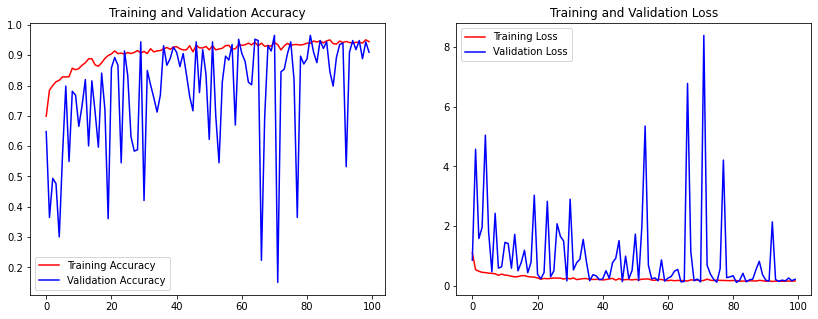

In [ ]:
eval_plot(history, "AccLostAlexnetModel")

Found 3044 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  app.launch_new_instance()



Confusion Matrix AlexnetModel



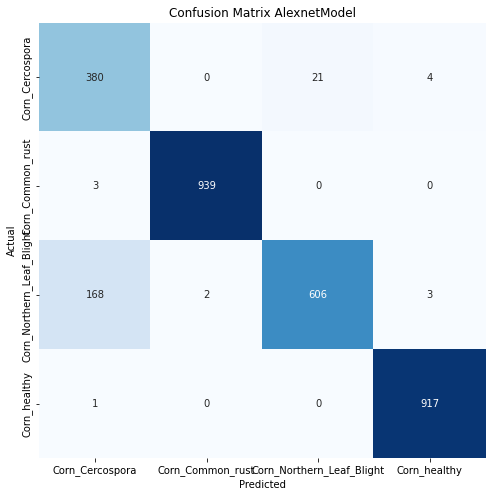



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       0.69      0.94      0.79       405
         Corn_Common_rust       1.00      1.00      1.00       942
Corn_Northern_Leaf_Blight       0.97      0.78      0.86       779
             Corn_healthy       0.99      1.00      1.00       918

                 accuracy                           0.93      3044
                macro avg       0.91      0.93      0.91      3044
             weighted avg       0.95      0.93      0.94      3044



<Figure size 432x288 with 0 Axes>

In [ ]:
evaluate(Alexnet, "AlexnetModel")

In [ ]:
save_model(Alexnet, "AlexnetModel93")

Saved model to disk


### Alexnet Hyparam Optimizer


In [ ]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp

In [ ]:
%load_ext tensorboard

In [ ]:
# HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([64, 128]))
# HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.2, 0.5))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd', 'RMSprop']))
HP_LR = hp.HParam('lr', hp.Discrete([0.01, 0.001]))
HP_BATCH_SIZE = hp.HParam('batch_size', hp.Discrete([64, 128, 256]))

METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_OPTIMIZER, HP_LR, HP_BATCH_SIZE],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [ ]:
xvl, yvl = zip(*(val_images[i] for i in range(len(val_images))))
x_val, y_val = np.vstack(xvl), np.vstack(yvl)

In [ ]:
def train_test_model(hparams):
  model = tf.keras.models.Sequential([
          tf.keras.Input(shape = (224, 224, 3)),
          tf.keras.layers.Conv2D(filters = 96, kernel_size = (11, 11), strides = (4, 4), padding = 'valid'),
          tf.keras.layers.Activation('relu'),
          tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'valid'),
          tf.keras.layers.BatchNormalization(),
          tf.keras.layers.Conv2D(filters = 256, kernel_size = (11, 11), strides = (1, 1), padding = 'valid'),
          tf.keras.layers.Activation('relu'),
          tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2),  padding = 'valid'),
          tf.keras.layers.BatchNormalization(),
          tf.keras.layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'valid'),
          tf.keras.layers.Activation('relu'),
          tf.keras.layers.BatchNormalization(), 
          tf.keras.layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'valid'),
          tf.keras.layers.Activation('relu'),
          tf.keras.layers.BatchNormalization(), 
          tf.keras.layers.Conv2D(filters = 256, kernel_size = (3, 3), strides = (1, 1), padding = 'valid'),
          tf.keras.layers.Activation('relu'),
          tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'valid'),
          tf.keras.layers.BatchNormalization(), 
          tf.keras.layers.Flatten(),
          tf.keras.layers.Dense(4096, input_shape = (224*224*3, )),
          tf.keras.layers.Activation('relu'),
          tf.keras.layers.Dropout(0.4),
          tf.keras.layers.BatchNormalization(),
          tf.keras.layers.Dense(4096),
          tf.keras.layers.Activation('relu'),
          tf.keras.layers.Dropout(0.4),
          tf.keras.layers.BatchNormalization(),
          tf.keras.layers.Dense(4),
          tf.keras.layers.Dense(4, activation = 'softmax'),
          ])
  # model.compile(
  #     optimizer=hparams[HP_OPTIMIZER],
  #     loss='categorical_crossentropy',
  #     metrics=['accuracy'],
  # )
  if (hparams[HP_OPTIMIZER] == 'adam'):
    opt = tf.keras.optimizers.Adam(learning_rate=hparams[HP_LR])
  elif (hparams[HP_OPTIMIZER] == 'sgd'):
    opt = tf.keras.optimizers.SGD(learning_rate=hparams[HP_LR])
  elif (hparams[HP_OPTIMIZER] == 'RMSprop'):
    opt = tf.keras.optimizers.RMSprop(learning_rate=hparams[HP_LR])

  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

  model.fit(train_images, 
            validation_data=val_images, 
            epochs = 25,
            batch_size = hparams[HP_BATCH_SIZE],
            callbacks = [
                tf.keras.callbacks.ReduceLROnPlateau(
                    monitor='val_loss',
                    factor=0.5,
                    patience=40,
                    verbose=1,
                    mode='auto',
                    cooldown=1
                )
            ]
            )
  _, accuracy = model.evaluate(x_val, y_val)


  return accuracy

In [ ]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=50)

In [ ]:
session_num = 0

for optimizer in HP_OPTIMIZER.domain.values:
  for lr in HP_LR.domain.values:
    for batch_size in HP_BATCH_SIZE.domain.values:
      hparams = {
          HP_OPTIMIZER: optimizer,
          HP_LR: lr,
          HP_BATCH_SIZE: batch_size,
      }
      run_name = "run-%d" % session_num
      print('--- Starting trial: %s' % run_name)
      print({h.name: hparams[h] for h in hparams})
      run('logs/hparam_tuning/' + run_name, hparams)
      session_num += 1

--- Starting trial: run-0
{'optimizer': 'RMSprop', 'lr': 0.001, 'batch_size': 64}
Epoch 1/25
96/96 [==============================] - 43s 421ms/step - loss: 1.9690 - accuracy: 0.6488 - val_loss: 4.4201 - val_accuracy: 0.4721 - lr: 0.0010
Epoch 2/25
96/96 [==============================] - 39s 402ms/step - loss: 0.8630 - accuracy: 0.7470 - val_loss: 1.4306 - val_accuracy: 0.6867 - lr: 0.0010
Epoch 3/25
96/96 [==============================] - 39s 408ms/step - loss: 0.7164 - accuracy: 0.7707 - val_loss: 44.8719 - val_accuracy: 0.3305 - lr: 0.0010
Epoch 4/25
96/96 [==============================] - 39s 410ms/step - loss: 0.5820 - accuracy: 0.7891 - val_loss: 7.5774 - val_accuracy: 0.2232 - lr: 0.0010
Epoch 5/25
96/96 [==============================] - 39s 409ms/step - loss: 0.6067 - accuracy: 0.7868 - val_loss: 4.0283 - val_accuracy: 0.5708 - lr: 0.0010
Epoch 6/25
96/96 [==============================] - 39s 410ms/step - loss: 0.5352 - accuracy: 0.7943 - val_loss: 0.6888 - val_accuracy: 0

In [ ]:
%%bash
wget -q 'https://storage.googleapis.com/download.tensorflow.org/tensorboard/hparams_demo_logs.zip'
unzip -q hparams_demo_logs.zip -d logs/hparam_demo

In [ ]:
%tensorboard --logdir logs/hparam_tuning

<IPython.core.display.Javascript object>

In [ ]:
shutil.move("/content/logs", "/content/drive/MyDrive/dataku/Dataset/hparam")
# shutil.move("/content/drive/MyDrive/dataku/Dataset/hparam/logs", "/content")

### Alexnet Hyparam Optimizer Model

In [ ]:
# TULIS KODE ANDA DISINI
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
import tensorflow as tf

# Feature Extraction Layer
# Alexnet = Sequential()

inputs = tf.keras.Input(shape = (224, 224, 3))
x = tf.keras.layers.Conv2D(filters = 96, kernel_size = (11, 11), strides = (4, 4), padding = 'valid')(inputs)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'valid')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Conv2D(filters = 256, kernel_size = (11, 11), strides = (1, 1), padding = 'valid')(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2),  padding = 'valid')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'valid')(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.BatchNormalization()(x) 
x = tf.keras.layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'valid')(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.BatchNormalization()(x) 
x = tf.keras.layers.Conv2D(filters = 256, kernel_size = (3, 3), strides = (1, 1), padding = 'valid')(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'valid')(x)
x = tf.keras.layers.BatchNormalization()(x) 
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(4096, input_shape = (224*224*3, ))(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dropout(0.4)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(4096)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dropout(0.4)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(4)(x)
outputs = tf.keras.layers.Dense(4, activation = 'softmax')(x)

AlexnetHparamOptimizer = tf.keras.Model(inputs = inputs, outputs = outputs)

print(AlexnetHparamOptimizer.summary())

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_10 (Conv2D)          (None, 54, 54, 96)        34944     
                                                                 
 activation_14 (Activation)  (None, 54, 54, 96)        0         
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 27, 27, 96)       0         
 2D)                                                             
                                                                 
 batch_normalization_14 (Bat  (None, 27, 27, 96)       384       
 chNormalization)                                                
                                                                 
 conv2d_11 (Conv2D)          (None, 17, 17, 256)       2973

In [ ]:
# AlexnetHparam.compile(
#     optimizer = 'adam',
#     loss = 'categorical_crossentropy',
#     metrics = ['accuracy']
# )
opt = tf.keras.optimizers.Adam(learning_rate=0.001)

AlexnetHparamOptimizer.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
historyAlexnetHparamOptimizer = AlexnetHparamOptimizer.fit(
    train_images,
    validation_data = val_images,
    batch_size = 128,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=40,
            verbose=1,
            mode='auto',
            cooldown=1
        )
    ]
)

Epoch 1/100
96/96 [==============================] - 44s 441ms/step - loss: 1.1234 - accuracy: 0.6797 - val_loss: 2.2207 - val_accuracy: 0.5150 - lr: 0.0010
Epoch 2/100
96/96 [==============================] - 42s 435ms/step - loss: 0.5524 - accuracy: 0.7720 - val_loss: 1.2918 - val_accuracy: 0.5193 - lr: 0.0010
Epoch 3/100
96/96 [==============================] - 42s 440ms/step - loss: 0.4566 - accuracy: 0.8049 - val_loss: 1.5073 - val_accuracy: 0.5408 - lr: 0.0010
Epoch 4/100
96/96 [==============================] - 42s 438ms/step - loss: 0.4496 - accuracy: 0.8160 - val_loss: 0.7238 - val_accuracy: 0.7682 - lr: 0.0010
Epoch 5/100
96/96 [==============================] - 43s 447ms/step - loss: 0.4024 - accuracy: 0.8196 - val_loss: 2.8813 - val_accuracy: 0.4893 - lr: 0.0010
Epoch 6/100
96/96 [==============================] - 43s 446ms/step - loss: 0.3621 - accuracy: 0.8538 - val_loss: 2.3302 - val_accuracy: 0.4335 - lr: 0.0010
Epoch 7/100
96/96 [==============================] - 43s 4

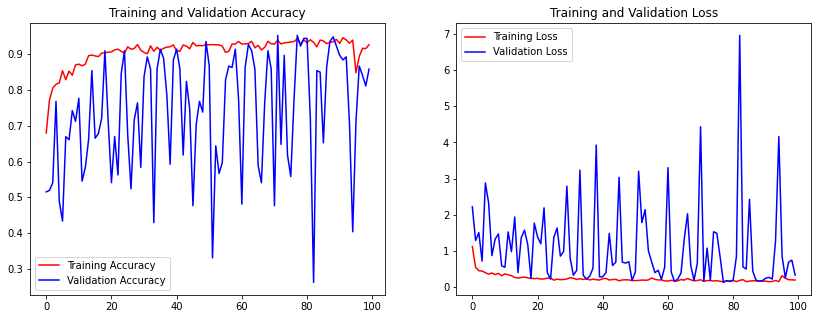

In [ ]:
eval_plot(historyAlexnetHparamOptimizer, "AccLostAlexnetHparamOptimizerModel")

Found 3044 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  app.launch_new_instance()



Confusion Matrix AlexnetHparamOptimizerModel



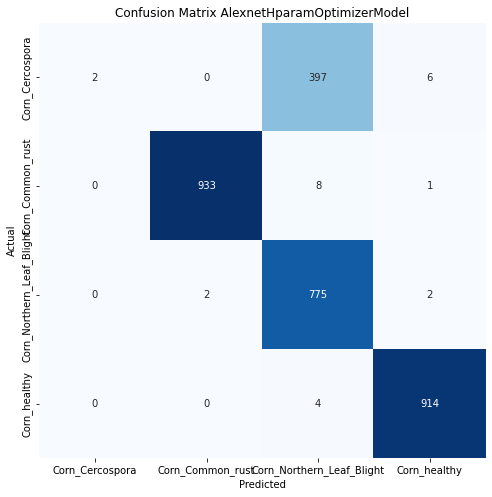



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       1.00      0.00      0.01       405
         Corn_Common_rust       1.00      0.99      0.99       942
Corn_Northern_Leaf_Blight       0.65      0.99      0.79       779
             Corn_healthy       0.99      1.00      0.99       918

                 accuracy                           0.86      3044
                macro avg       0.91      0.75      0.70      3044
             weighted avg       0.91      0.86      0.81      3044



<Figure size 432x288 with 0 Axes>

In [ ]:
evaluate(AlexnetHparamOptimizer, "AlexnetHparamOptimizerModel")

In [ ]:
save_model(AlexnetHparamOptimizer, "AlexnetHparamOptimizerModel86")

Saved model to disk


### Test data

Contoh 1 Test model

[]


ValueError: ignored

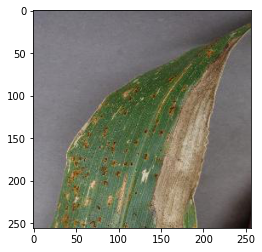

In [ ]:
from PIL import Image

img_upload = Image.open("/content/drive/MyDrive/dataset/corn/test/Corn_Cercospora/Corn_Cercospora244.jpg")
# img_upload = Image.open("/content/drive/MyDrive/dataset/corn/test/Corn_Common_rust/Corn_Common_rust1039.jpg")
# img_upload = Image.open("/content/drive/MyDrive/dataset/corn/test/Corn_Northern_Leaf_Blight/Corn_Northern_Leaf_Blight172.jpg")
# img_upload = Image.open("/content/drive/MyDrive/dataset/corn/test/Corn_healthy/Corn_healthy168.jpg")
img_plt = plt.imshow(img_upload)
img = np.array(img_upload)
img = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2RGB)

model_list = [
              '/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/AlexnetModel93-ori.h5',
              '/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/AlexnetHparamOptimizerModel86-ori.h5'
              ]
labels = ['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy']

for m in model_list:
    model = load_model(m)
    size_img = model.layers[0].output_shape[1:3]
    print(size_img)
    imgs = cv2.resize(img, (244,244))
    imgs = imgs.astype('float32') / 255
    pred = model.predict(np.expand_dims(imgs, axis=0))[0]
    print('Model :', m.split('/')[-1])
    print('Predicted Label :',labels[((pred > 0.5)+0).ravel()[0]])
    print('Probability :',[ round(elem, 4) for elem in pred ][0])
    print('===============\n')

Contoh 2 Test model

In [ ]:
import PIL
from tensorflow.keras.models import Sequential, model_from_json

def predictModel(image_path):
    img = PIL.Image.open(image_path)
    img_resized = img.resize((224, 224), PIL.Image.LANCZOS)
    plt.imshow(img_resized)
    plt.axis('off')
    plt.title("First")
    img_array = np.expand_dims(np.array(img_resized), axis=0)

    # json_file = open('/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/AlexnetModel93.json', 'r')
    # loaded_model_json = json_file.read()
    # json_file.close()
    # loaded_model = model_from_json(loaded_model_json)
    # model = loaded_model.load_weights('/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/AlexnetModel93-json.h5')

    json_file = open('/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/AlexnetModel93.json', 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)
    model = loaded_model.load_weights("/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/AlexnetModel93-json.h5")
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    # model = load_model('/content/drive/MyDrive/dataku/Kuliah/Semester 7/Prak. Pembelajaran Mesin/Model/AlexnetModel93-ori.h5')

    predik = model.predict(img_array)

    labels = np.argmax(predik, axis=1)
    if labels == 0 :
      plt.title(f"Pred : {predik}\nLabels : {labels}Cercospora")
    elif labels == 1 :
      plt.title(f"Pred : {predik}\nLabels : {labels}Common Rust")
    elif labels == 2 :
      plt.title(f"Pred : {predik}\nLabels : {labels}Northern Leaf Blight")
    elif labels == 3 :
      plt.title(f"Pred : {predik}\nLabels : {labels}Healthy")


AttributeError: ignored

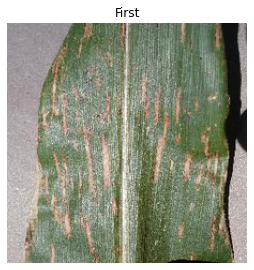

In [ ]:
import cv2
from matplotlib import pyplot as plt
  
fig = plt.figure(figsize=(25, 15))
  
rows = 3
columns = 4

fig.add_subplot(rows, columns, 1)
predictModel("/content/corn/test/Corn_Cercospora/Corn_Cercospora323.jpg")
fig.add_subplot(rows, columns, 2)
predictModel("/content/corn/test/Corn_Common_rust/Corn_Common_rust475.jpg")
fig.add_subplot(rows, columns, 3)
predictModel("/content/corn/test/Corn_Northern_Leaf_Blight/Corn_Northern_Leaf_Blight344.jpg")
fig.add_subplot(rows, columns, 4)
predictModel("/content/corn/test/Corn_healthy/Corn_healthy437.jpg")